In [1]:
!pip install pypdf Pillow


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.5/294.5 kB 2.9 MB/s eta 0:00:00ta 0:00:01

[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: pip install --upgrade pip


In [2]:
from pypdf import PdfReader
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import matplotlib

matplotlib.rcParams.update({'font.size': 22})


In [3]:
# reads one image from the pdf

reader = PdfReader('BA1_QL40OBI_23APRIL_run5_up_2mm_360res.pdf')

page = reader.pages[75]
count = 0

for image_file_object in page.images:
    with open(str(count) + image_file_object.name, "wb") as fp:
        fp.write(image_file_object.data)
        count += 1

In [4]:
img = Image.open('0Im1.jpg')
# img

(2893, 585, 3)


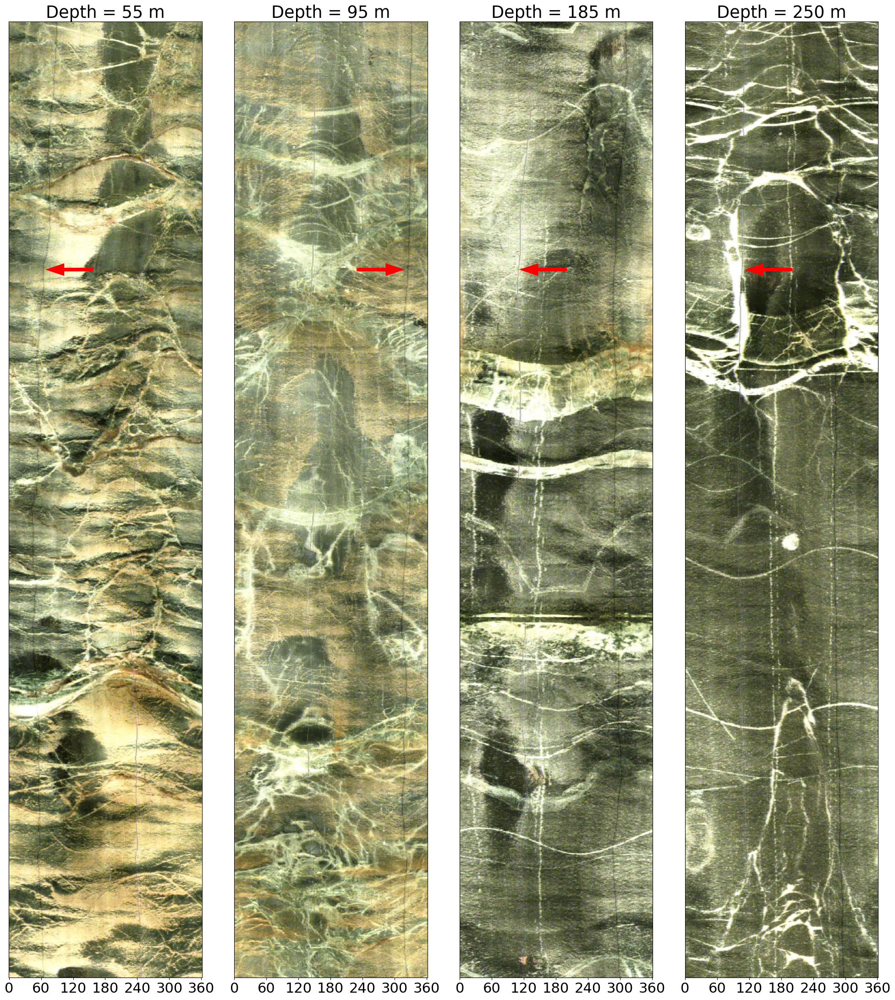

In [5]:
fig, axes = plt.subplots(1, 4, figsize=(20, 30), sharex=True, sharey=True)

pages = [7, 15, 33, 46, 70]
depths = [55, 95, 185, 250, 365]

for n, ax in enumerate(axes):
    reader = PdfReader('BA1_QL40OBI_23APRIL_run5_up_2mm_360res.pdf')
    page = reader.pages[pages[n]]
    for image_file_object in page.images:
        img_name = str(n) + image_file_object.name
        with open(img_name, 'wb') as fp:
            fp.write(image_file_object.data)
    img = Image.open(img_name)
    ax.imshow(img)
    ax.set_title(f'Depth = {depths[n]} m')
ax.set_xticks(np.arange(0, 585, 585//6))
ax.set_xticklabels(np.arange(0, 361, 60))
ax.set_yticks([])
axes[0].arrow(x=250, y=750, dx=-125, dy=0, color='red',linewidth=5, length_includes_head=True, head_width=25)
axes[1].arrow(x=375, y=750, dx=125, dy=0, color='red', linewidth=5,length_includes_head=True, head_width=25)
axes[2].arrow(x=320, y=750, dx=-125, dy=0, color='red',linewidth=5, length_includes_head=True, head_width=25)
axes[3].arrow(x=320, y=750, dx=-125, dy=0, color='red',linewidth=5, length_includes_head=True, head_width=25)
fig.tight_layout()
print(np.array(img).shape)
fig.savefig('fig7.pdf', bbox_inches='tight')

In [6]:
!pwd

/fp/homes01/u01/ec-johnmai/repos/tensilePaper


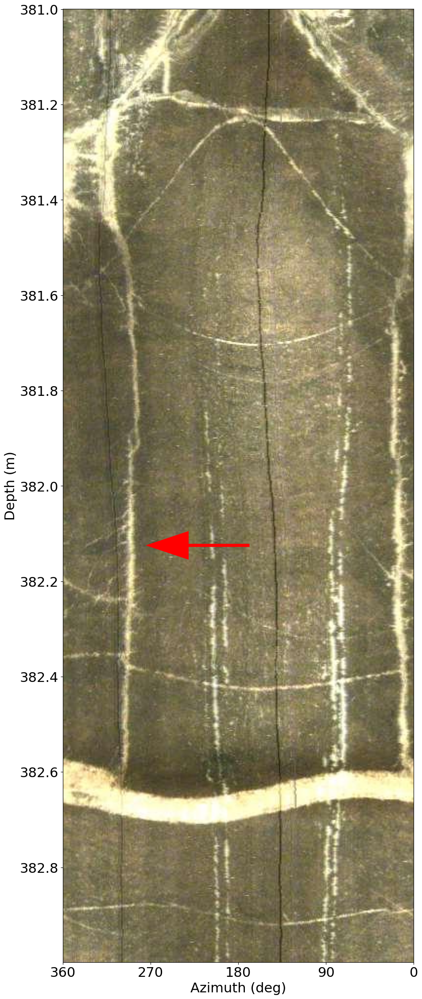

In [10]:
fig, ax = plt.subplots(figsize=(10, 30))

# pages = [7, 15, 33, 46, 70]
# depths = [55, 95, 185, 250, 365]

# for n, ax in enumerate(axes):
    # reader = PdfReader('BA1_QL40OBI_23APRIL_run5_up_2mm_360res.pdf')
reader = PdfReader('5. BA1A_381m-383m_Oriented_without_grid.pdf')
page = reader.pages[0]
for image_file_object in page.images:
    img_name = str(n) + image_file_object.name
    with open(img_name, 'wb') as fp:
        fp.write(image_file_object.data)
    break
img = Image.open(img_name)
ax.imshow(img)
# ax.set_title(f'Depth = {depths[n]} m')
ax.set_xticks(np.arange(0, 361, 90))
ax.set_yticks(np.linspace(0, 978, 11))
ax.set_yticklabels(np.round(np.arange(381.0, 383.2, 0.2),1))
ax.set_ylabel('Depth (m)')
ax.set_xlabel('Azimuth (deg)')
ax.set_xlim(360, 0)
ax.arrow(x=170, y=550, dx=100, dy=0, color='red',linewidth=5, length_includes_head=True, head_width=25)
# axes[1].arrow(x=375, y=750, dx=125, dy=0, color='red', linewidth=5,length_includes_head=True, head_width=25)
# axes[2].arrow(x=320, y=750, dx=-125, dy=0, color='red',linewidth=5, length_includes_head=True, head_width=25)
# axes[3].arrow(x=320, y=750, dx=-125, dy=0, color='red',linewidth=5, length_includes_head=True, head_width=25)
fig.tight_layout()
fig.savefig('fig7.pdf', bbox_inches='tight')

In [16]:
np.array(img).shape

(978, 360, 3)

In [ ]:
diameter = 6
diameter_cm = 6 * 2.54
radius = diameter_cm / 2
circumference = 2 * np.pi * radius
print('one pixel across:', circumference/585)

In [ ]:
fig, ax = plt.subplots(figsize=(20, 15))
ax.imshow(np.array(img)[1700:1800,440:470,0], cmap='Spectral_r')

In [ ]:
plt.imshow(np.array(img)[:,:,0], cmap='nipy_spectral')

In [ ]:
r, g, b = img.split()

In [ ]:
fig, ax = plt.subplots(1, 4, figsize=(10, 10))

z = np.zeros_like(r)
z += 255 + 255 + 255

ax[0].imshow(r, cmap='Reds')
ax[1].imshow(g, cmap='Greens')
ax[2].imshow(b, cmap='Blues')
ax[3].imshow(img)
ax[3].imshow(z)